In [1]:
import os
import re
import numpy as np 
import glob
import pandas as pd 
import pydicom as dicom
import seaborn as sns
import matplotlib.pyplot as plt

# https://www.kaggle.com/ammarnassanalhajali/brain-tumor-3d-eda
from scipy.ndimage import zoom
from matplotlib import animation, rc
rc('animation', html='jshtml')

DATA_PATH = "../input/rsna-miccai-brain-tumor-radiogenomic-classification/"

In [2]:
# load dicom
def load_dicom(path):
    data = dicom.read_file(path)
    data = data.pixel_array
    data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data

# animate tensor slice by slice 
def create_animation(ims):
    fig = plt.figure(figsize=(5, 5))
    plt.axis('off')
    im = plt.imshow(ims[0])

    def animate_func(i):
        im.set_array(ims[i])
        #return [im]
    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//4)

# read many dicoms
def load_dicom_line(path):
    t_paths = sorted(
        glob.glob(os.path.join(path, "*")), 
        key=lambda x: int(x[:-4].split("-")[-1]),
    )
    images = []
    for filename in t_paths:
        data = load_dicom(filename)
        if data.max() == 0:
            continue
        images.append(data)
        
    return images

def load_source_dicom_line(path):
    t_paths = sorted(
        glob.glob(os.path.join(path, "*")), 
        key=lambda x: int(x[:-4].split("-")[-1]),
    )
    images = []
    for filename in t_paths:
        data = dicom.read_file(filename)
        if data.pixel_array.max() == 0:
            continue
        images.append(data)
        
    return images

# Analysis data

## Dataframe train_labels.csv

In [3]:
df_path = DATA_PATH + "train_labels.csv"
df = pd.read_csv(df_path)

In [4]:
df

,BraTS21ID,MGMT_value
0,0,1
1,2,1
2,3,0
3,5,1
4,6,1
...,...,...
580,1005,1
581,1007,1
582,1008,1
583,1009,0


{1: 307, 0: 278}


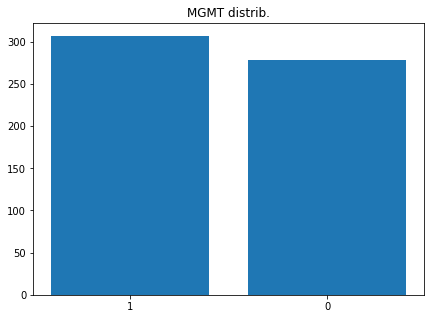

In [5]:
# target distribution
bin_mgmt = df['MGMT_value'].value_counts().to_dict()
print(bin_mgmt)
_, ax = plt.subplots(figsize=(7, 5))
ax.bar(range(2), list(bin_mgmt.values()), tick_label=list(bin_mgmt.keys()))
ax.set_title("MGMT distrib.")
plt.show()

In [6]:
# all scans have same number of slices?

new_df = df.copy()
for i, r in df.iterrows():
    patient_path = DATA_PATH + "train/" + str(r['BraTS21ID']).zfill(5)
    flair_c, t1w_c = len(load_dicom_line(patient_path + "/FLAIR")), len(load_dicom_line(patient_path + "/T1w")) 
    t1wce_c, t2w_c = len(load_dicom_line(patient_path + "/T1wCE")), len(load_dicom_line(patient_path + "/T2w"))
    new_df.loc[i, 'flair_c'], new_df.loc[i, 't1w_c'], new_df.loc[i, 't1wce_c'], new_df.loc[i, 't2w_c'] = flair_c, t1w_c, t1wce_c, t2w_c
    
new_df

,BraTS21ID,MGMT_value,flair_c,t1w_c,t1wce_c,t2w_c
0,0,1,288.0,29.0,86.0,274.0
1,2,1,67.0,27.0,88.0,269.0
2,3,0,71.0,28.0,88.0,285.0
3,5,1,277.0,26.0,83.0,272.0
4,6,1,68.0,28.0,89.0,270.0
...,...,...,...,...,...,...
580,1005,1,21.0,21.0,21.0,21.0
581,1007,1,114.0,114.0,114.0,114.0
582,1008,1,45.0,137.0,138.0,47.0
583,1009,0,22.0,22.0,22.0,22.0


In [7]:
for i, r in new_df.iterrows():
    scans = r[['flair_c', 't1w_c', 't1wce_c', 't2w_c']]
    new_df.loc[i, 'all_c_same'] = (scans == r['t1w_c']).all()
new_df

,BraTS21ID,MGMT_value,flair_c,t1w_c,t1wce_c,t2w_c,all_c_same
0,0,1,288.0,29.0,86.0,274.0,False
1,2,1,67.0,27.0,88.0,269.0,False
2,3,0,71.0,28.0,88.0,285.0,False
3,5,1,277.0,26.0,83.0,272.0,False
4,6,1,68.0,28.0,89.0,270.0,False
...,...,...,...,...,...,...,...
580,1005,1,21.0,21.0,21.0,21.0,True
581,1007,1,114.0,114.0,114.0,114.0,True
582,1008,1,45.0,137.0,138.0,47.0,False
583,1009,0,22.0,22.0,22.0,22.0,True


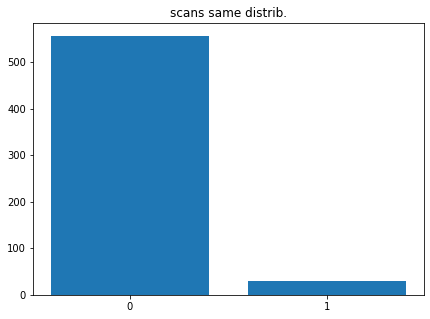

In [8]:
bin_same = new_df['all_c_same'].astype(int).value_counts().to_dict()

_, ax = plt.subplots(figsize=(7, 5))
ax.bar(range(2), list(bin_same.values()), tick_label=list(bin_same.keys()))
ax.set_title("scans same distrib.")
plt.show()

## DICOM images

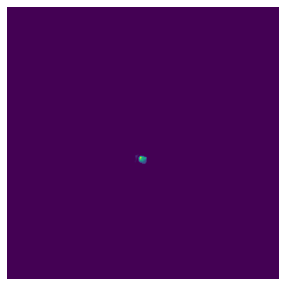

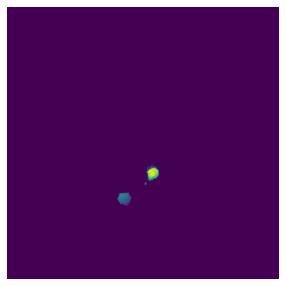

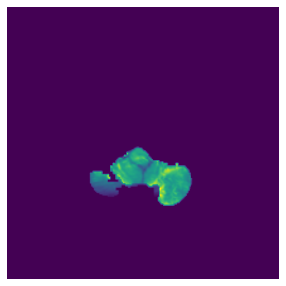

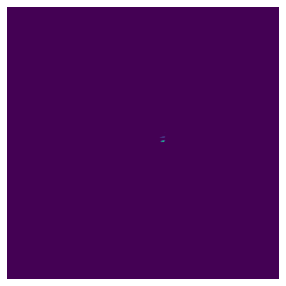

In [9]:
# 00000 flair
img_00090_flair = load_dicom_line(DATA_PATH + "train/00090/FLAIR/")
anim_00090_flair = create_animation(img_00090_flair);

# 00090 t1w
img_00090_t1w = load_dicom_line(DATA_PATH + "train/00090/T1w/")
anim_00090_t1w = create_animation(img_00090_t1w);

# 00123 t1wce
img_00123_t1wce = load_dicom_line(DATA_PATH + "train/00123/T1wCE/")
anim_00123_t1wce = create_animation(img_00123_t1wce);

# 00709 t2w
img_00709_t2w = load_dicom_line(DATA_PATH + "train/00709/T2w/")
anim_00709_t2w = create_animation(img_00709_t2w);

In [10]:
anim_00090_flair

In [11]:
anim_00090_t1w

In [12]:
anim_00123_t1wce

In [13]:
anim_00709_t2w

## PSEUDO-RGB

In [14]:
def load_dicom_xyz(path):
    _3d = load_source_dicom_line(path)
    # get metadata orientation
    x1, y1, _, x2, y2, _ = [round(j) for j in _3d[0].ImageOrientationPatient]
    cords = [x1, y1, x2, y2]
    position_first, position_last = _3d[0].ImagePositionPatient, _3d[-1].ImagePositionPatient
    # get main metadata
    spacing_z = np.abs(float(_3d[-1].SliceLocation) - float(_3d[0].SliceLocation)) / len(_3d)
    spacing_x_y = _3d[0].PixelSpacing
    assert spacing_x_y[0] == spacing_x_y[1]
    # form tensor
    _3d = [np.expand_dims(i.pixel_array, axis=0) for i in _3d]
    _3d = np.concatenate(_3d)
    # rescale
    _3d = zoom(_3d, (spacing_z/spacing_x_y[0], 1, 1))#first axis - rescaled
    
    # reorder planes if needed and rotate voxel
    if cords == [1, 0, 0, 0]:
        if position_first[1] < position_last[1]:
            _3d = _3d[::-1] 
        _3d = _3d.transpose((1, 0, 2))
        
    elif cords == [0, 1, 0, 0]:
        if position_first[0] < position_last[0]:
            _3d = _3d[::-1]
        _3d = _3d.transpose((1, 2, 0))
        _3d = np.rot90(_3d, 2, axes=(1, 2))
        
    elif cords == [1, 0, 0, 1]:
        if position_first[2] > position_last[2]:
            _3d = _3d[::-1]
        _3d = np.rot90(_3d, 2)

    return _3d
    

def get_pseudo_rgb(img):
    #img = np.clip(img, min_a, max_a)
    img_nan = np.where(img == img.min(), np.nan, img)

    pimages = []
    for i in range(3):
        # get pseudorgb shape
        shape_2_part = list(np.nanmax(img_nan, axis=i).shape)
        shape = [3] + shape_2_part
        
        prgb = np.ones(shape)
        prgb[0, :, :] = np.nanmean(img_nan, axis=i)
        prgb[0, :, :] /= np.nanmax(prgb[0, :, :])
        prgb[1, :, :] = np.nanmax(img_nan, axis=i)
        prgb[1, :, :] /= np.nanmax(prgb[1, :, :])
        prgb[2, :, :] = np.nanstd(img_nan, axis=i)
        prgb[2, :, :] /= np.nanmax(prgb[2, :, :])
        
        prgb = np.swapaxes(prgb, 0, 2)
        prgb = np.swapaxes(prgb, 0, 1)
        prgb = np.where(np.isnan(prgb), 0, prgb)

        pimages.append(prgb)
    
    return pimages


def viz_pseudo_rgb(path):
    _3dimg = load_dicom_xyz(path)
    ps_3d = get_pseudo_rgb(_3dimg)
    
    _, ax = plt.subplots(figsize=(20, 18), ncols=3)
    ax = ax.flatten()
    for i in range(3):
        ax[i].axis('off')
        ax[i].imshow(ps_3d[i])

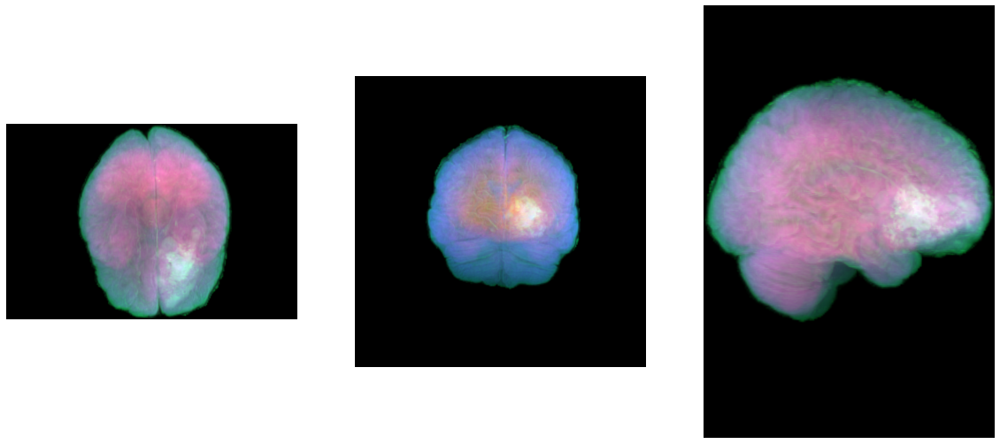

In [15]:
path = DATA_PATH + "train/00000/FLAIR/"
viz_pseudo_rgb(path)

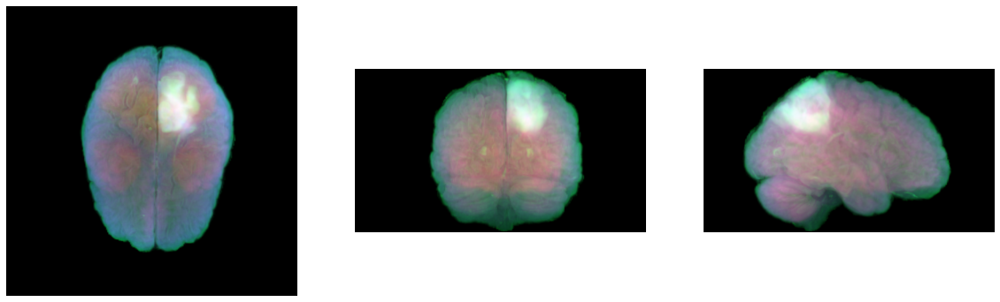

In [16]:
path = DATA_PATH + "train/00085/FLAIR/"
viz_pseudo_rgb(path)

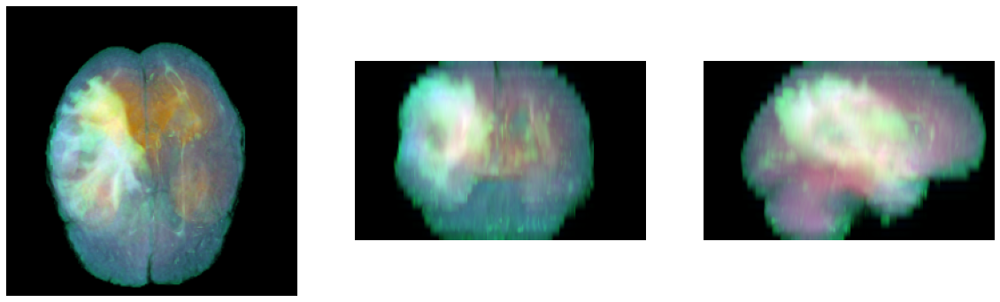

In [17]:
path = DATA_PATH + "train/00123/FLAIR/"
viz_pseudo_rgb(path)

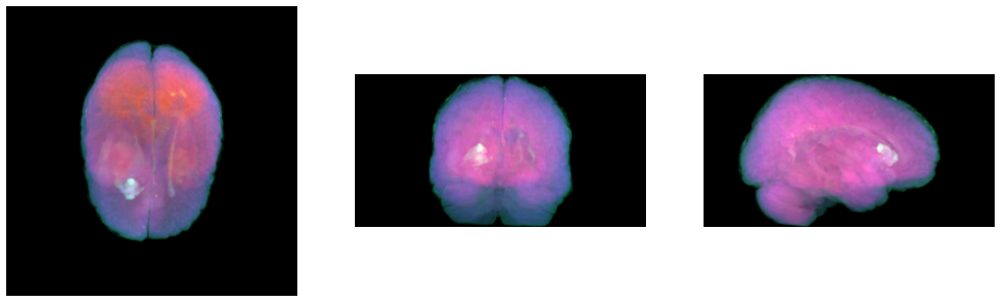

In [18]:
path = DATA_PATH + "train/00021/FLAIR/"
viz_pseudo_rgb(path)